**Load required library and read dataset**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv("Churn.csv")

In [3]:
df.head()

,account_length,voice_mail_plan,voice_mail_messages,day_mins,evening_mins,night_mins,international_mins,customer_service_calls,international_plan,day_calls,day_charge,evening_calls,evening_charge,night_calls,night_charge,international_calls,international_charge,total_charge,churn
0,128,1,25,265.1,197.4,244.7,10.0,1,0,110,45.07,99,16.78,91,11.01,3,2.70,75.56,0
1,107,1,26,161.6,195.5,254.4,13.7,1,0,123,27.47,103,16.62,103,11.45,3,3.70,59.24,0
2,137,0,0,243.4,121.2,162.6,12.2,0,0,114,41.38,110,10.30,104,7.32,5,3.29,62.29,0
3,84,0,0,299.4,61.9,196.9,6.6,2,1,71,50.90,88,5.26,89,8.86,7,1.78,66.80,0
4,75,0,0,166.7,148.3,186.9,10.1,3,1,113,28.34,122,12.61,121,8.41,3,2.73,52.09,0


**EDA**

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   account_length          3333 non-null   int64  
 1   voice_mail_plan         3333 non-null   int64  
 2   voice_mail_messages     3333 non-null   int64  
 3   day_mins                3333 non-null   float64
 4   evening_mins            3333 non-null   float64
 5   night_mins              3333 non-null   float64
 6   international_mins      3333 non-null   float64
 7   customer_service_calls  3333 non-null   int64  
 8   international_plan      3333 non-null   int64  
 9   day_calls               3333 non-null   int64  
 10  day_charge              3333 non-null   float64
 11  evening_calls           3333 non-null   int64  
 12  evening_charge          3333 non-null   float64
 13  night_calls             3333 non-null   int64  
 14  night_charge            3333 non-null   

In [5]:
df.isnull().sum()  #there are no  missing values

account_length            0
voice_mail_plan           0
voice_mail_messages       0
day_mins                  0
evening_mins              0
night_mins                0
international_mins        0
customer_service_calls    0
international_plan        0
day_calls                 0
day_charge                0
evening_calls             0
evening_charge            0
night_calls               0
night_charge              0
international_calls       0
international_charge      0
total_charge              0
churn                     0
dtype: int64

In [6]:
#pip install autoviz    # for automated EDA

Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine
Shape of your Data Set loaded: (3333, 19)
#######################################################################################
######################## C L A S S 

,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
total_charge,2227,float64,0,0.000000,66.816682,0,
day_mins,1667,float64,0,0.000000,50.015002,0,
day_charge,1667,float64,0,0.000000,50.015002,0,
evening_mins,1611,float64,0,0.000000,48.334833,0,
night_mins,1591,float64,0,0.000000,47.734773,0,
evening_charge,1440,float64,0,0.000000,43.204320,0,
night_charge,933,float64,0,0.000000,27.992799,0,
account_length,212,int64,0,0.000000,6.360636,0,
international_mins,162,float64,0,0.000000,4.860486,0,
international_charge,162,float64,0,0.000000,4.860486,0,


    19 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Number of All Scatter Plots = 45


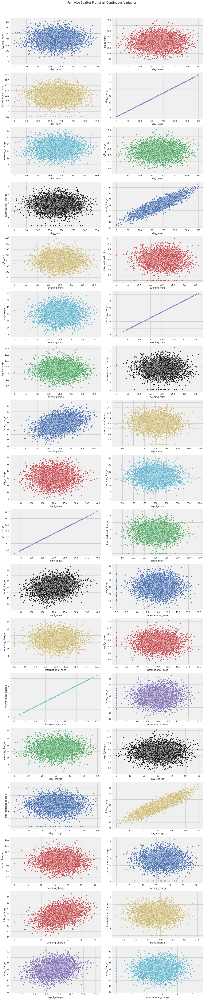

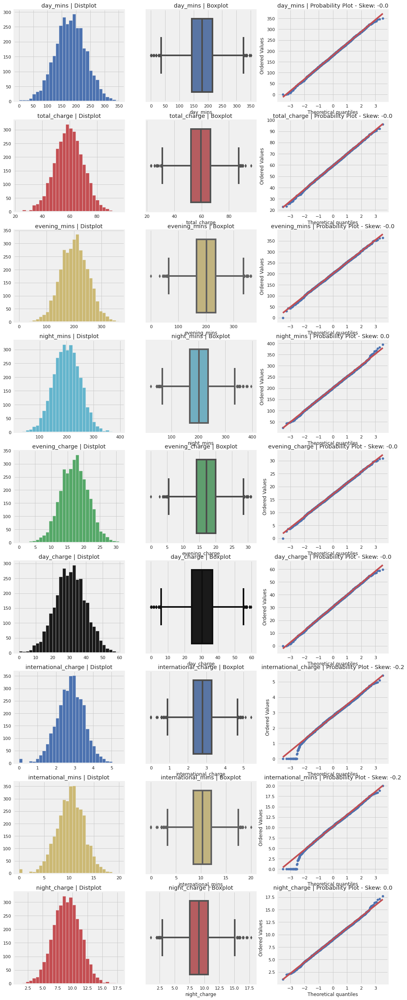

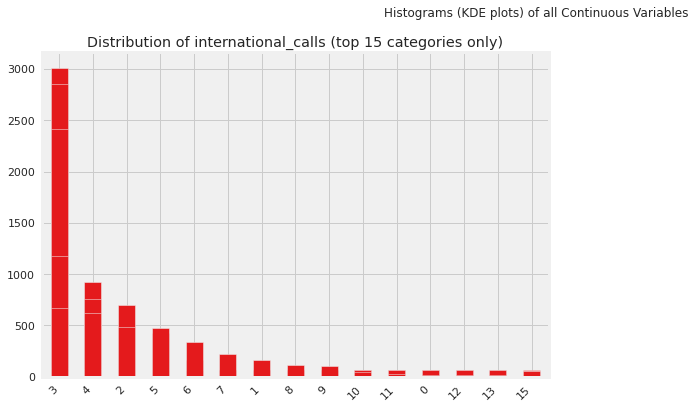

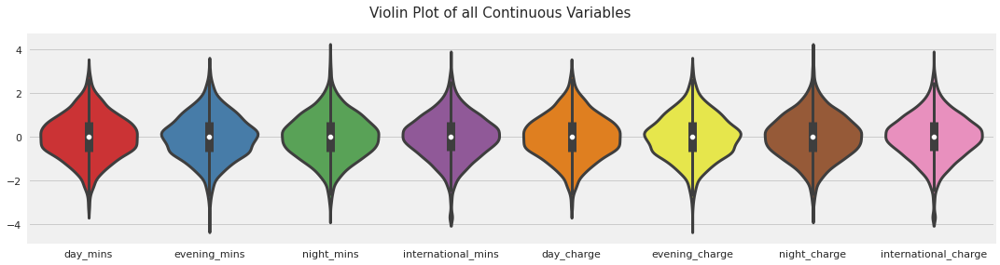

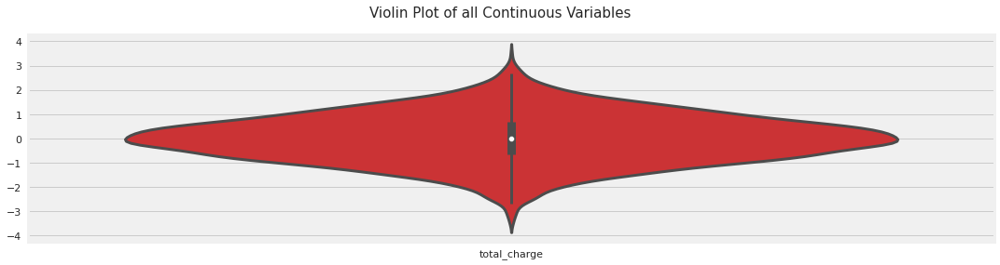

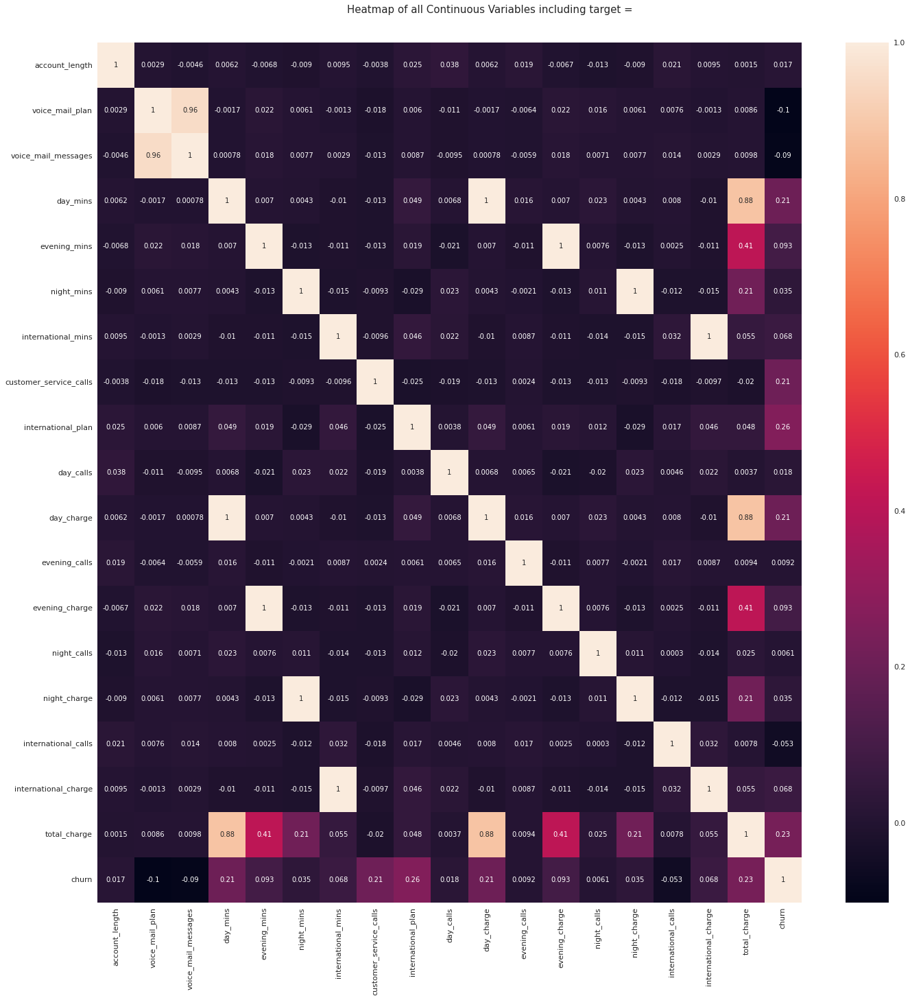

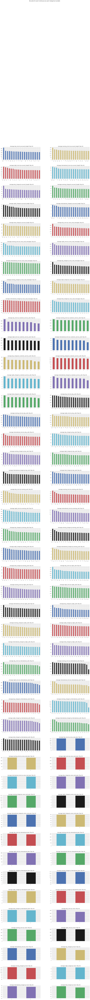

All Plots done
Time to run AutoViz = 55 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [7]:
#AutoViz is maily used for automated EDA
from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline
av = AutoViz_Class()
df_av = av.AutoViz('Churn.csv')

In [8]:
#find correlation for all the feature 
df.corr()["churn"]

account_length            0.016541
voice_mail_plan          -0.102148
voice_mail_messages      -0.089728
day_mins                  0.205151
evening_mins              0.092796
night_mins                0.035493
international_mins        0.068239
customer_service_calls    0.208750
international_plan        0.259852
day_calls                 0.018459
day_charge                0.205151
evening_calls             0.009233
evening_charge            0.092786
night_calls               0.006141
night_charge              0.035496
international_calls      -0.052844
international_charge      0.068259
total_charge              0.231549
churn                     1.000000
Name: churn, dtype: float64

**Feature Engineering**

In [9]:
X = df.iloc[:,0:18]   # features
Y =df['churn']        #target

In [10]:
#Feature Engineering : method 1 using RFE
from sklearn.tree import DecisionTreeClassifier
model = DecisionTreeClassifier(criterion='entropy')

In [11]:
from sklearn.feature_selection import RFE

rfe = RFE(model, n_features_to_select=8) #Decision tree
fit = rfe.fit(X, Y)

print(fit.n_features_,fit.support_,fit.ranking_)

8 [False False  True False  True  True False  True  True False False False
 False False False  True  True  True] [ 3  9  1  6  1  1  7  1  1  8 11  2  5  4 10  1  1  1]


In [12]:
pd.DataFrame({"Colums":X.columns,"Ranking":fit.ranking_})

,Colums,Ranking
0,account_length,3
1,voice_mail_plan,9
2,voice_mail_messages,1
3,day_mins,6
4,evening_mins,1
5,night_mins,1
6,international_mins,7
7,customer_service_calls,1
8,international_plan,1
9,day_calls,8


In [13]:
#Feature Engineering method-3
from sklearn.ensemble import ExtraTreesClassifier
# feature extraction
model1 = ExtraTreesClassifier()
model1.fit(X, Y)

print(model1.feature_importances_)

[0.03012152 0.02655837 0.02188869 0.08920077 0.04312822 0.03138568
 0.0437799  0.13041942 0.07396261 0.0317417  0.09177125 0.02914943
 0.04496251 0.03126195 0.03069386 0.04955149 0.03995132 0.16047131]


In [14]:
importance = pd.DataFrame({"Colums":model1.feature_names_in_,"Value":model1.feature_importances_})
importance.sort_values("Value")

,Colums,Value
2,voice_mail_messages,0.021889
1,voice_mail_plan,0.026558
11,evening_calls,0.029149
0,account_length,0.030122
14,night_charge,0.030694
13,night_calls,0.031262
5,night_mins,0.031386
9,day_calls,0.031742
16,international_charge,0.039951
4,evening_mins,0.043128


**evening_calls** & **night_calls** has very very less correaltion , hence we are dropping these two features

In [15]:
df.drop(['evening_calls','night_calls'],axis=1,inplace =True)

In [16]:
df.head()

,account_length,voice_mail_plan,voice_mail_messages,day_mins,evening_mins,night_mins,international_mins,customer_service_calls,international_plan,day_calls,day_charge,evening_charge,night_charge,international_calls,international_charge,total_charge,churn
0,128,1,25,265.1,197.4,244.7,10.0,1,0,110,45.07,16.78,11.01,3,2.70,75.56,0
1,107,1,26,161.6,195.5,254.4,13.7,1,0,123,27.47,16.62,11.45,3,3.70,59.24,0
2,137,0,0,243.4,121.2,162.6,12.2,0,0,114,41.38,10.30,7.32,5,3.29,62.29,0
3,84,0,0,299.4,61.9,196.9,6.6,2,1,71,50.90,5.26,8.86,7,1.78,66.80,0
4,75,0,0,166.7,148.3,186.9,10.1,3,1,113,28.34,12.61,8.41,3,2.73,52.09,0


In [17]:
#Updated feature and target after droping 
X = df.iloc[:,0:16]   # features
Y =df['churn']        #target

In [18]:
X

,account_length,voice_mail_plan,voice_mail_messages,day_mins,evening_mins,night_mins,international_mins,customer_service_calls,international_plan,day_calls,day_charge,evening_charge,night_charge,international_calls,international_charge,total_charge
0,128,1,25,265.1,197.4,244.7,10.0,1,0,110,45.07,16.78,11.01,3,2.70,75.56
1,107,1,26,161.6,195.5,254.4,13.7,1,0,123,27.47,16.62,11.45,3,3.70,59.24
2,137,0,0,243.4,121.2,162.6,12.2,0,0,114,41.38,10.30,7.32,5,3.29,62.29
3,84,0,0,299.4,61.9,196.9,6.6,2,1,71,50.90,5.26,8.86,7,1.78,66.80
4,75,0,0,166.7,148.3,186.9,10.1,3,1,113,28.34,12.61,8.41,3,2.73,52.09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192,1,36,156.2,215.5,279.1,9.9,2,0,77,26.55,18.32,12.56,6,2.67,60.10
3329,68,0,0,231.1,153.4,191.3,9.6,3,0,57,39.29,13.04,8.61,4,2.59,63.53
3330,28,0,0,180.8,288.8,191.9,14.1,2,0,109,30.74,24.55,8.64,6,3.81,67.74
3331,184,0,0,213.8,159.6,139.2,5.0,2,1,105,36.35,13.57,6.26,10,1.35,57.53


**Feature Scalling**

In [19]:
from sklearn.preprocessing import StandardScaler
sc= StandardScaler()
X = sc.fit_transform(X)


**Splitting the data into train & test**

In [20]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train, y_test = train_test_split(X,Y,train_size=0.75,random_state=42)

**Building various model and checking the accuracy to select best model**

In [21]:
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression

In [22]:
models = []
models.append(('LR', LogisticRegression(max_iter=400)))
models.append(('KNN', KNeighborsClassifier()))
models.append(('RF', RandomForestClassifier()))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC()))
models.append(('XGboost',XGBClassifier()))

In [23]:
results = []
names = []

for name, model in models:
	kfold = KFold(n_splits=10)
	cv_results = cross_val_score(model,X,Y,cv=kfold, scoring='accuracy')
	results.append(cv_results)
	names.append(name)
	msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
	print(msg)

LR: 0.862568 (0.023139)
KNN: 0.901283 (0.014466)
RF: 0.977495 (0.009805)
NB: 0.874582 (0.015216)
SVM: 0.930993 (0.015943)
XGboost: 0.979295 (0.010183)


**XGBOOST** and **RANDOM FOREST** has high accuracy when compared to other models

Using XGBoost Classifier

In [24]:
# Hyper Parameter Optimization
params = {
 "learning_rate" : [0.05,0.10,0.15],
  "max_depth" : [ 6, 8, 10, 12, 15],
 "min_child_weight" : [ 1, 3, 5, 7 ],
 "gamma" : [0.0,0.1,0.2]
}

In [25]:
import xgboost as xgb
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
classifier = xgb.XGBClassifier()

In [26]:
randomcv = RandomizedSearchCV(classifier, params,n_iter=5,scoring='accuracy',cv= kfold)

In [27]:
randomcv.fit(X_train, y_train)

RandomizedSearchCV(cv=KFold(n_splits=10, random_state=None, shuffle=False),
                   estimator=XGBClassifier(), n_iter=5,
                   param_distributions={'gamma': [0.0, 0.1, 0.2],
                                        'learning_rate': [0.05, 0.1, 0.15],
                                        'max_depth': [6, 8, 10, 12, 15],
                                        'min_child_weight': [1, 3, 5, 7]},
                   scoring='accuracy')

In [28]:
print('Best : {}, using {}'.format(randomcv.best_score_,randomcv.best_params_))

Best : 0.9783935742971888, using {'min_child_weight': 1, 'max_depth': 12, 'learning_rate': 0.15, 'gamma': 0.2}


In [29]:
# Build final XGBoost model using best parameter
final_xgb = XGBClassifier(max_depth = 12,learning_rate=0.15,gamma=0.2,min_child_weight=1)

In [30]:
final_xgb.fit(X_train,y_train)

XGBClassifier(gamma=0.2, learning_rate=0.15, max_depth=12)

In [31]:
# predict using test data
y_pred = final_xgb.predict(X_test)

In [32]:
#confusion matrix
confusion_matrix(y_test,y_pred)

array([[709,   0],
       [ 15, 110]])

In [33]:
# Accuracy score for the test data
accuracy_score(y_test,y_pred)

0.9820143884892086

**Using Random Forest :** 

Hyper Parameter tuning to check for the best params

In [34]:
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.ensemble import RandomForestClassifier

kfold = KFold(n_splits=10)
f_model = RandomForestClassifier()

param = {"n_estimators":[50,100,150,200],"criterion":["gini","entropy"]}

grid = GridSearchCV(estimator = f_model,param_grid = param,cv = KFold())

In [35]:
grid_result = grid.fit(X_train, y_train)

In [36]:
print('Best : {}, using {}'.format(grid_result.best_score_,grid_result.best_params_))

Best : 0.9763903807615228, using {'criterion': 'gini', 'n_estimators': 200}


In [37]:
#Building the final model with best parameter
model_final = RandomForestClassifier(criterion= 'gini', n_estimators= 150)
model_final.fit(X_train, y_train)

RandomForestClassifier(n_estimators=150)

In [38]:
#Predicting the model using test data
pred=model_final.predict(X_test)

In [39]:
#Accuracy for the test data
accuracy_score(y_test,pred)

0.9808153477218226

In [40]:
#confusion mertix
confusion_matrix(pred,y_test)

array([[709,  16],
       [  0, 109]])

In [41]:
#classification report
classification_report(pred,y_test)

'              precision    recall  f1-score   support\n\n           0       1.00      0.98      0.99       725\n           1       0.87      1.00      0.93       109\n\n    accuracy                           0.98       834\n   macro avg       0.94      0.99      0.96       834\nweighted avg       0.98      0.98      0.98       834\n'

**Save the model in the pickle format**

In [42]:
import pickle

In [43]:
filename = "Telecom_churn"
pickle.dump(model,open(filename,'wb'))